In [1]:
from autoencoder import DenseAutoencoder

from sklearn.decomposition import PCA
from tensorflow.keras.datasets import mnist

import numpy as np 
import seaborn as sns
import pandas as pd

In [2]:
(x_train, y_train), (_, _) = mnist.load_data()
x_train = x_train.astype('float32') / 255.
x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:])))
print(x_train.shape)
y_train.shape

(60000, 784)


(60000,)

In [3]:
autoencoder = DenseAutoencoder(input_shape=(784, ), latent_dim=2, layer_sizes=[128, 64, 32])

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 784)]             0         
_________________________________________________________________
dense (Dense)                (None, 128)               100480    
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 66        
_________________________________________________________________
dense_4 (Dense)              (None, 64)                192       
_________________________________________________________________
dense_5 (Dense)              (None, 128)              

In [4]:
autoencoder.fit(x_train, epochs=15, batch_size=16)

Epoch 1/15
3750/3750 [==============================] - 9s 2ms/step - loss: 0.2150
Epoch 2/15
3750/3750 [==============================] - 8s 2ms/step - loss: 0.1950
Epoch 3/15
3750/3750 [==============================] - 8s 2ms/step - loss: 0.1895
Epoch 4/15
3750/3750 [==============================] - 8s 2ms/step - loss: 0.1853
Epoch 5/15
3750/3750 [==============================] - 8s 2ms/step - loss: 0.1829
Epoch 6/15
3750/3750 [==============================] - 8s 2ms/step - loss: 0.1817
Epoch 7/15
3750/3750 [==============================] - 9s 2ms/step - loss: 0.1809
Epoch 8/15
3750/3750 [==============================] - 9s 2ms/step - loss: 0.1794
Epoch 9/15
3750/3750 [==============================] - 9s 2ms/step - loss: 0.1782
Epoch 10/15
3750/3750 [==============================] - 8s 2ms/step - loss: 0.1771
Epoch 11/15
3750/3750 [==============================] - 9s 2ms/step - loss: 0.1764
Epoch 12/15
3750/3750 [==============================] - 9s 2ms/step - loss: 0.1756
E

In [5]:
x_autoencoded = autoencoder.encode(x_train)

In [6]:
x_autoencoded = pd.DataFrame(x_autoencoded)

In [7]:
x_autoencoded["label"] = y_train
x_autoencoded.columns = ["1st_ax", "2nd_ax", "label"]

In [8]:
import matplotlib.pyplot as plt

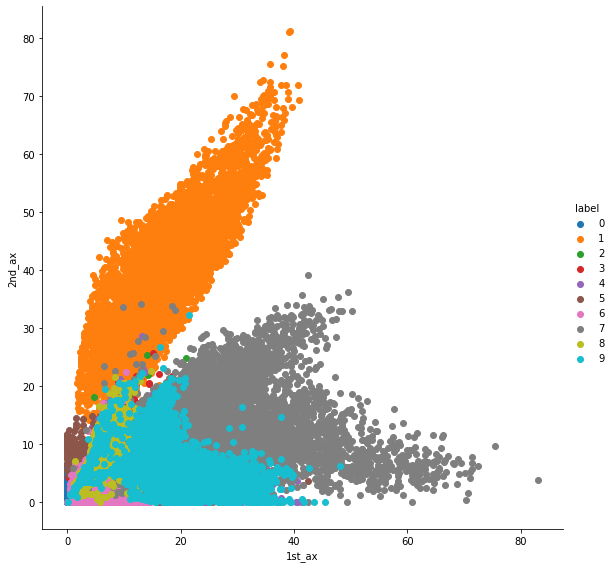

In [9]:
sns.FacetGrid(x_autoencoded, hue="label", height=8).map(plt.scatter, "1st_ax", "2nd_ax").add_legend()

In [10]:
x_pca = PCA(n_components=2).fit_transform(x_train)

In [11]:
x_pca = pd.DataFrame(x_pca)
x_pca["label"] = y_train
x_pca.columns = ["1st_pca", "2nd_pca", "label"]

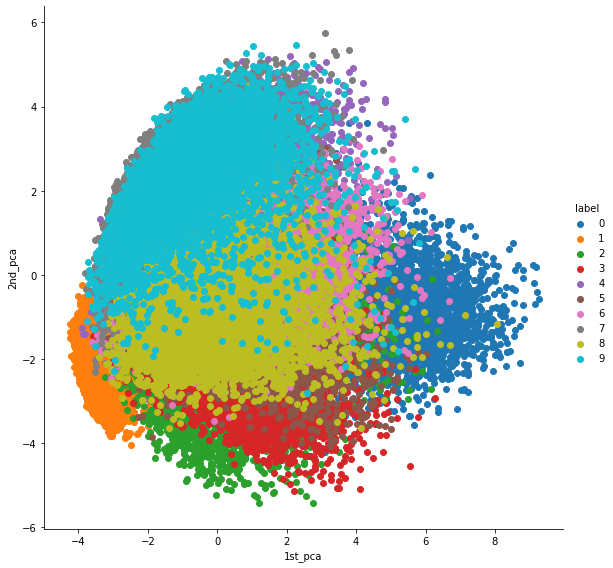

In [13]:
sns.FacetGrid(x_pca, hue="label", height=8).map(plt.scatter, "1st_pca", "2nd_pca").add_legend()